# Data Science Storytelling Using Spotify Dataset

In this project I will be using data analysis, hypothesis formulation, and data visualization to tell a story about the dataset. I will be using the Spotify dataset which comprises of 2,017 songs that have been downloaded from Spotify, accompanied by 16 distinct characteristics. These characteristics primarily pertain to song attributes such as tempo, energy, and danceability, among others. The target variable of interest is a binary indicator that represents whether a given song has been liked or disliked by a single user, denoted by 1 or 0, respectively. The aim of this study is to identify the song characteristics that exhibit predictability with respect to the user's likeability.


In [20]:
#Importing Libraries
import pandas as pda
import numpy as npy
import seaborn as sbn
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [21]:
spotify_d = pda.read_csv('Spotify_user_ratings.csv')

In [22]:
spotify_d

,Unnamed: 0,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
0,0,0.01020,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,4.0,0.286,1,Mask Off,Future
1,1,0.19900,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,4.0,0.588,1,Redbone,Childish Gambino
2,2,0.03440,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,4.0,0.173,1,Xanny Family,Future
3,3,0.60400,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,4.0,0.230,1,Master Of None,Beach House
4,4,0.18000,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,174.004,4.0,0.904,1,Parallel Lines,Junior Boys
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012,2012,0.00106,0.584,274404,0.932,0.002690,1,0.1290,-3.501,1,0.3330,74.976,4.0,0.211,0,Like A Bitch - Kill The Noise Remix,Kill The Noise
2013,2013,0.08770,0.894,182182,0.892,0.001670,1,0.0528,-2.663,1,0.1310,110.041,4.0,0.867,0,Candy,Dillon Francis
2014,2014,0.00857,0.637,207200,0.935,0.003990,0,0.2140,-2.467,1,0.1070,150.082,4.0,0.470,0,Habit - Dack Janiels & Wenzday Remix,Rain Man
2015,2015,0.00164,0.557,185600,0.992,0.677000,1,0.0913,-2.735,1,0.1330,150.011,4.0,0.623,0,First Contact,Twin Moons


It is worth highlighting a few important aspects of the dataset. 
1. The 'key' feature is encoded with integers, commencing at C=1 and increasing by semi-tones thereafter (e.g., C#=2, etc.). 
2. the 'time signature' feature denotes the number of beats present within each measure of a song. Notably, the majority of popular songs conform to the 4/4 time signature, resulting in this value being the most frequently occurring. 
3. the 'mode' feature reflects whether a song is major or minor, with 1 indicating the former and 0 the latter. 

4. The 'valence' feature provides a metric of a song's positivity; higher scores indicate that the song possesses a more upbeat and cheerful tone, while lower scores reflect a more somber and melancholy atmosphere.

In [23]:
#Removing Unnamed column from the data. It seems to be an additional index added by the source system 
spotify_d.drop(['Unnamed: 0'],axis=1, inplace=True)

In [24]:
# Summarize the data 

spotify_d.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2017 entries, 0 to 2016
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   acousticness      2017 non-null   float64
 1   danceability      2017 non-null   float64
 2   duration_ms       2017 non-null   int64  
 3   energy            2017 non-null   float64
 4   instrumentalness  2017 non-null   float64
 5   key               2017 non-null   int64  
 6   liveness          2017 non-null   float64
 7   loudness          2017 non-null   float64
 8   mode              2017 non-null   int64  
 9   speechiness       2017 non-null   float64
 10  tempo             2017 non-null   float64
 11  time_signature    2017 non-null   float64
 12  valence           2017 non-null   float64
 13  target            2017 non-null   int64  
 14  song_title        2017 non-null   object 
 15  artist            2017 non-null   object 
dtypes: float64(10), int64(4), object(2)
memory

In [25]:
# reviewing data attributes 

spotify_d.describe()

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target
count,2017.000000,2017.000000,2.017000e+03,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000
mean,0.187590,0.618422,2.463062e+05,0.681577,0.133286,5.342588,0.190844,-7.085624,0.612295,0.092664,121.603272,3.968270,0.496815,0.505702
std,0.259989,0.161029,8.198181e+04,0.210273,0.273162,3.648240,0.155453,3.761684,0.487347,0.089931,26.685604,0.255853,0.247195,0.500091
min,0.000003,0.122000,1.604200e+04,0.014800,0.000000,0.000000,0.018800,-33.097000,0.000000,0.023100,47.859000,1.000000,0.034800,0.000000
25%,0.009630,0.514000,2.000150e+05,0.563000,0.000000,2.000000,0.092300,-8.394000,0.000000,0.037500,100.189000,4.000000,0.295000,0.000000
50%,0.063300,0.631000,2.292610e+05,0.715000,0.000076,6.000000,0.127000,-6.248000,1.000000,0.054900,121.427000,4.000000,0.492000,1.000000
75%,0.265000,0.738000,2.703330e+05,0.846000,0.054000,9.000000,0.247000,-4.746000,1.000000,0.108000,137.849000,4.000000,0.691000,1.000000
max,0.995000,0.984000,1.004627e+06,0.998000,0.976000,11.000000,0.969000,-0.307000,1.000000,0.816000,219.331000,5.000000,0.992000,1.000000


In [26]:
# Determine the unique values for each feature

spotify_d.nunique()

acousticness        1394
danceability         632
duration_ms         1921
energy               719
instrumentalness    1107
key                   12
liveness             793
loudness            1808
mode                   2
speechiness          792
tempo               1919
time_signature         4
valence              853
target                 2
song_title          1956
artist              1343
dtype: int64

In [27]:
# how many song duplicates are there?

count_songs = spotify_d['song_title'].value_counts() 
dupes = count_songs[count_songs > 1] 
len(dupes)

59

In [28]:
# Dropping the dupes

spotify_d.drop_duplicates(subset=['song_title'] , keep='first', inplace=True)

In [29]:
#Validate dupes have been dropped from the dataset

count_songs = spotify_d['song_title'].value_counts() 
dupes = count_songs[count_songs > 1] 
len(dupes)

0

DATA NOTE:
All dupe songs have been remvoed 

In [15]:
# looking at the top artists by song count 

spotify_d.time_signature.value_counts().head(10)

4.0    1832
3.0      92
5.0      31
1.0       1
Name: time_signature, dtype: int64

In [30]:
# Calc distribution of liked v/s disliiked songs 

spotify_d.target.value_counts()

1    984
0    972
Name: target, dtype: int64

ANALYSIS:
There seems to be close to an even split between liked and disliked songs and no null values 

## Data Viz. 

<Axes: >

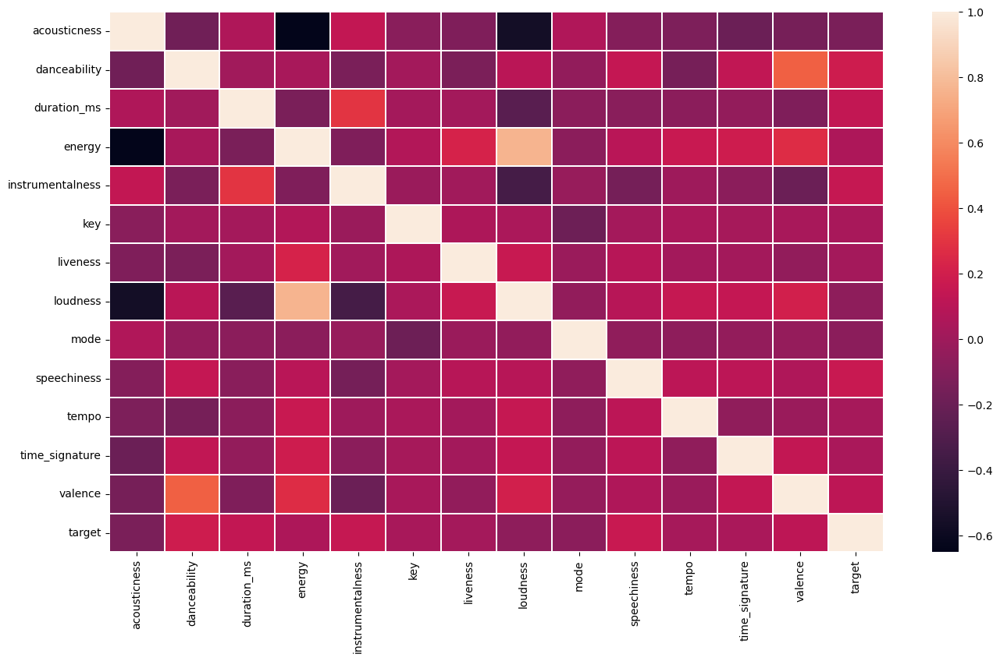

In [31]:
# feature correlation heatmap 

fig, ax = plt.subplots(figsize=(16,9))
sbn.heatmap(spotify_d.corr(), linewidths=.2, ax=ax)

###ANALYSIS OF HEATMAP
1. It seems that none of the song attributes are highly correlated with target 
2. As expected, certain genre/attributes are negatively correlated for exampled Accousticness to Loudness 
3. Certain song attributes are positively correlated as expected for example loudness and energy 
 

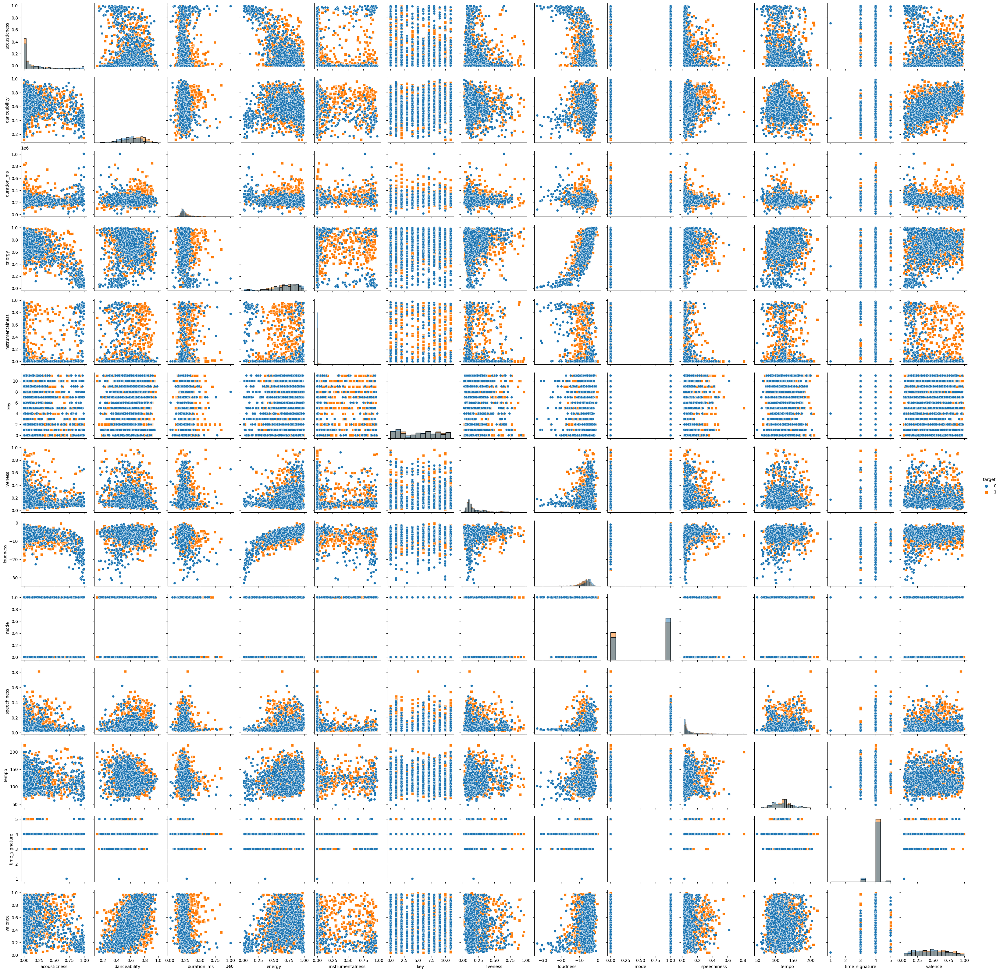

In [33]:
# Creating a pairplot to better understand the data relationships
sbn.pairplot(spotify_d, hue="target", diag_kind="hist", markers=["o", "s"])


From the above scatterplots, we can deduce that the following variables seem to have no/low correlation with our target: 'key', 'mode' 'duration' and 'time signature'. 
We will drop these as part of our continuing analysis. 

There are certain features that I will further investigate: 'speechiness', 'danceability', 'instrumentalness', 'acousticness', 'loudness', 'energy', 'liveness', and 'valence'.

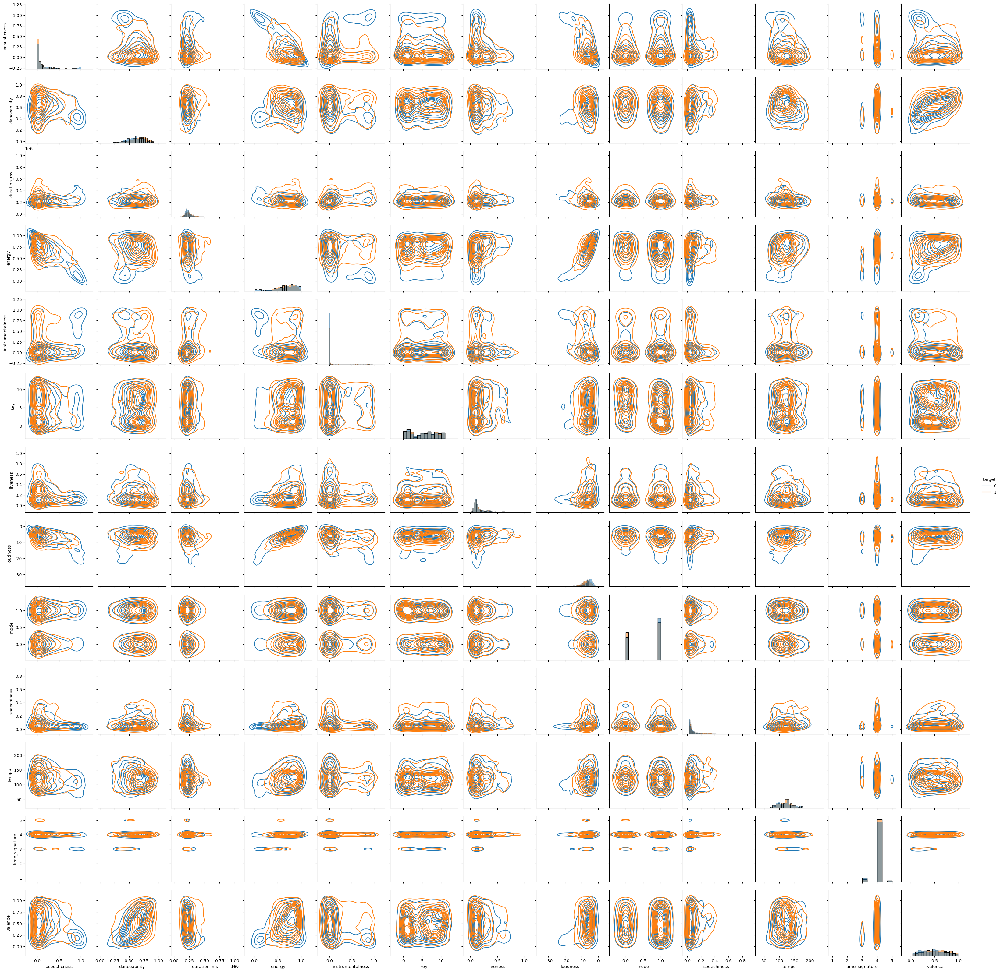

In [36]:
sbn.pairplot(spotify_d, hue="target", diag_kind="hist", kind="kde")


In [39]:
spotify_new_d = spotify_d[['speechiness', 'danceability', 'instrumentalness', 'acousticness', 'loudness', 'energy', 'liveness','valence', 'target']]

Post reviewing the above plots, the hypothesis is that speechiness, danceability are likely positively correlated to likeability (target). I will also be analyzing the above mentioned remaining variables. 

<Axes: xlabel='acousticness', ylabel='Count'>

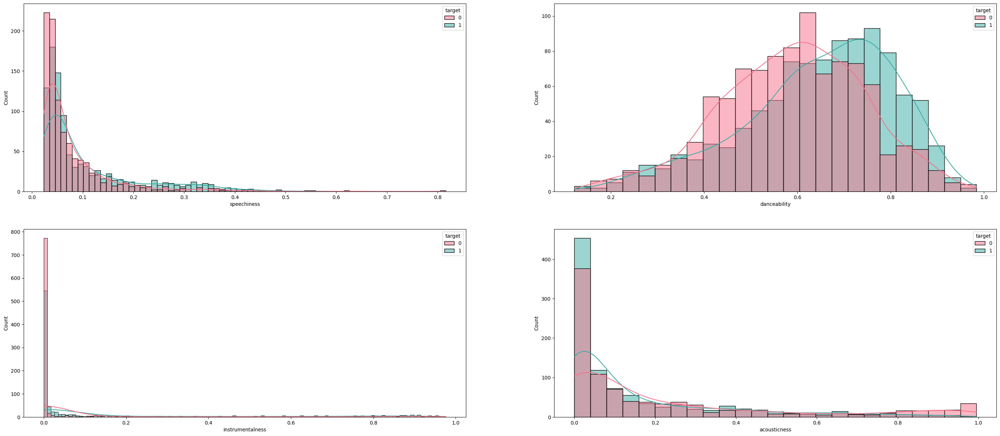

In [51]:
#Data Viz for speechiness, danceability, instrumentalness, & acousticness
fig, ax =plt.subplots(2,2, figsize=(35,15)) 

sbn.histplot(x = spotify_new_d['speechiness'], hue = spotify_new_d['target'], kde=True, ax=ax[0,0], palette="husl")

sbn.histplot(x = spotify_new_d['danceability'], hue = spotify_new_d['target'], kde= True, ax=ax[0,1], palette="husl")

sbn.histplot(x = spotify_new_d['instrumentalness'], hue = spotify_new_d['target'], kde= True, ax=ax[1,0], palette="husl")

sns.histplot(x = spotify_new_d['acousticness'], hue = spotify_new_d['target'], kde= True, ax=ax[1,1], palette="husl")

Analysis:

The data indicates a discernible pattern wherein songs with elevated scores in the "speechiness" and "danceability" categories are generally more appealing to listeners. Conversely, the majority of songs evaluated scored unfavorably in the "instrumentalness" category, though those that did score higher in this area tended to be better-liked overall.


Regarding "acousticness," a negative correlation with likeability is evident. Specifically, songs with higher scores in this category generally received lower ratings in terms of overall appeal.

<Axes: xlabel='loudness', ylabel='Count'>

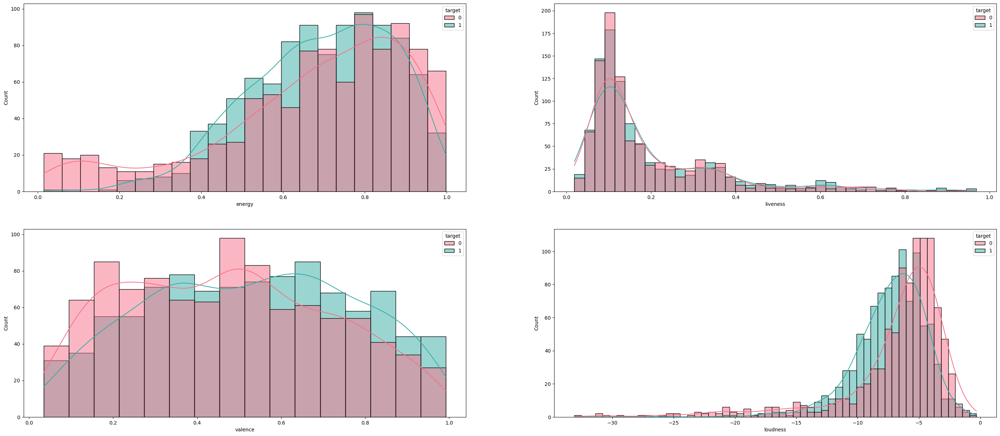

In [50]:
#Data Viz for energy, liveness, valence, & loudness
fig, ax =plt.subplots(2,2, figsize=(35,15)) 

sbn.histplot(x = spotify_new_d['energy'], hue = spotify_new_d['target'], kde=True, ax=ax[0,0], palette="husl")

sbn.histplot(x = spotify_new_d['liveness'], hue = spotify_new_d['target'], kde= True, ax=ax[0,1], palette="husl")

sbn.histplot(x = spotify_new_d['valence'], hue = spotify_new_d['target'], kde= True, ax=ax[1,0], palette="husl")

sbn.histplot(x = spotify_new_d['loudness'], hue = spotify_new_d['target'], kde= True, ax=ax[1,1], palette="husl")



Analysis: 
The data suggests an intriguing relationship between the "energy" feature and likeability. In particular, there appears to be a sweet spot where these two variables are positively correlated. However, when the energy level is too high or too low, likeability appears to suffer.

In contrast, no meaningful correlation between "liveness" and likeability was found.

On the other hand, a clear positive correlation exists between "valence" and likeability, indicating that songs with more positive and cheerful tonalities tend to be better-liked.

Finally, a distinct negative correlation was observed between "loudness" and likeability, indicating that excessively loud songs are less appealing to listeners.

# Conclusions

Based on the observed correlations between various song attributes and likeability, we can make some reasonable assumptions regarding which features are likely to predict positive and negative reception by listeners. Specifically, danceability, speechiness, instrumentalness, and valence are likely to be good predictors of likeability, while loudness and acousticness may predict unlikeability.

It is noteworthy that speechiness and instrumentalness are typically seen as opposite qualities, yet both appear to have a positive correlation with likeability. Similarly, loudness and acousticness are often seen as opposites, yet both appear to have a negative correlation with likeability. Further investigation would be necessary to better understand the underlying factors contributing to these trends.

Given that our problem involves binary classification, a logistic regression model may be a useful tool for analyzing these relationships and predicting song likeability.